<a href="https://colab.research.google.com/github/yaolihua081/Stanford-CS06dataviz/blob/main/CS06FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

from nltk.corpus import stopwords 

import seaborn as sns
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import sys, platform, numpy as np, nltk, re, sklearn, pandas as pd, seaborn as sns, collections
tmp = nltk.download(['stopwords', 'gutenberg','punkt'], quiet=True) # See https://www.nltk.org/book/ch02.html
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, HashingVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.datasets import fetch_20newsgroups
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
from nltk.tokenize.casual import casual_tokenize
from nltk.tokenize import TweetTokenizer
from nltk import WordPunctTokenizer,RegexpTokenizer
from gensim.summarization.summarizer import summarize
from gensim.summarization import keywords as G_KEA
!pip install rake-nltk # https://pypi.org/project/rake-nltk/
from rake_nltk import Metric, Rake
# Increase viewable area of Pandas tables, numpy arrays, plots
pd.set_option('max_rows', 5, 'max_columns', 500, 'max_colwidth', 1, 'precision', 2)
np.set_printoptions(linewidth=10000, precision=4, edgeitems=20, suppress=True)

import seaborn as sns


import matplotlib.pyplot as plt
import hashlib
import matplotlib.style as style
style.use('fivethirtyeight')
import altair as alt

  Created wheel for rake-nltk: filename=rake_nltk-1.0.4-py2.py3-none-any.whl size=7819 sha256=68af70ed0d4dfdbdfc871f6e8cbc24ef69e77943a82c31f3b9b94d500f697673
  Stored in directory: /root/.cache/pip/wheels/ef/92/fc/271b3709e71a96ffe934b27818946b795ac6b9b8ff8682483f
Successfully built rake-nltk


When using ARDA data in publications and presentations, the author should acknowledge the Association of Religion Data Archives and the original collector(s) of the data (e.g., The data were downloaded from the Association of Religion Data Archives, www.theARDA.com, and were collected by [name of principal investigator(s)].

2. I acknowledge that the Association of Religion Data Archives was established to preserve data, to improve access and increase the use of data, and to allow comparisons across data files. I will therefore make responsible use of all data, software and documentation obtained from the Association of Religion Data Archives.

3. I acknowledge that the Association of Religion Data Archives, and all parties associated with the Association of Religion Data Archives (including the principal investigators), offer the data and documentation "as is" with no warranty and assume no legal liability or responsibility for the completeness, accuracy, or usefulness of the data, or fitness for a particular purpose.

4. Software which can be downloaded from this site is published by and Copyright ©MicroCase Corporation, and may not be re-distributed or reproduced in any form without express written permission of the publisher.

5. This agreement shall be governed by, construed and interpreted in accordance with the laws of the Commonwealth of Pennsylvania. You further agree to submit to the jurisdicti

In [2]:
from google.colab import files
files.upload()

Saving indian_food.csv to indian_food.csv


{'indian_food.csv': b'name,ingredients,diet,prep_time,cook_time,flavor_profile,course,state,region\r\nBalu shahi,"Maida flour, yogurt, oil, sugar",vegetarian,45,25,sweet,dessert,West Bengal,East\r\nBoondi,"Gram flour, ghee, sugar",vegetarian,80,30,sweet,dessert,Rajasthan,West\r\nGajar ka halwa,"Carrots, milk, sugar, ghee, cashews, raisins",vegetarian,15,60,sweet,dessert,Punjab,North\r\nGhevar,"Flour, ghee, kewra, milk, clarified butter, sugar, almonds, pistachio, saffron, green cardamom",vegetarian,15,30,sweet,dessert,Rajasthan,West\r\nGulab jamun,"Milk powder, plain flour, baking powder, ghee, milk, sugar, water, rose water",vegetarian,15,40,sweet,dessert,West Bengal,East\r\nImarti,"Sugar syrup, lentil flour",vegetarian,10,50,sweet,dessert,West Bengal,East\r\nJalebi,"Maida, corn flour, baking soda, vinegar, curd, water, turmeric, saffron, cardamom",vegetarian,10,50,sweet,dessert,Uttar Pradesh,North\r\nKaju katli,"Cashews, ghee, cardamom, sugar",vegetarian,10,20,sweet,dessert,-1,-1\r\n

In [55]:
from numpy import nan
Indian_food=pd.read_csv('indian_food.csv')
Indian_food.dropna()
Indian_food.loc[111,'region']='North'
filter=Indian_food['region'].values != '-1'  
Indian_food=Indian_food[filter]
filter=Indian_food['state'] !='-1'
Indian_food=Indian_food[filter]
Indian_food['region'].unique()
filter=Indian_food['cook_time'] !=-1
Indian_food=Indian_food[filter]

filter=Indian_food['flavor_profile'] !='-1'
Indian_food=Indian_food[filter]

Indian_food['Ingredient_count']=Indian_food['ingredients'].apply(lambda x: len(x.split(',')))

,name,ingredients,diet,prep_time,cook_time,flavor_profile,course,state,region
0,Balu shahi,"Maida flour, yogurt, oil, sugar",vegetarian,45,25,sweet,dessert,West Bengal,East
1,Boondi,"Gram flour, ghee, sugar",vegetarian,80,30,sweet,dessert,Rajasthan,West
...,...,...,...,...,...,...,...,...,...
253,Mawa Bati,"Milk powder, dry fruits, arrowroot powder, all purpose flour",vegetarian,20,45,sweet,dessert,Madhya Pradesh,Central
254,Pinaca,"Brown rice, fennel seeds, grated coconut, black pepper, ginger powder",vegetarian,-1,-1,sweet,dessert,Goa,West


array(['East', 'West', 'North', 'North East', 'South', 'Central', nan], dtype=object)

In [56]:
Indian_food

,name,ingredients,diet,prep_time,cook_time,flavor_profile,course,state,region,Ingredient_count
0,Balu shahi,"Maida flour, yogurt, oil, sugar",vegetarian,45,25,sweet,dessert,West Bengal,East,4
1,Boondi,"Gram flour, ghee, sugar",vegetarian,80,30,sweet,dessert,Rajasthan,West,3
...,...,...,...,...,...,...,...,...,...,...
251,Bebinca,"Coconut milk, egg yolks, clarified butter, all purpose flour",vegetarian,20,60,sweet,dessert,Goa,West,4
253,Mawa Bati,"Milk powder, dry fruits, arrowroot powder, all purpose flour",vegetarian,20,45,sweet,dessert,Madhya Pradesh,Central,4


In [12]:
Indian_food

,name,ingredients,diet,prep_time,cook_time,flavor_profile,course,state,region,Ingredient_count
0,Balu shahi,"Maida flour, yogurt, oil, sugar",vegetarian,45,25,sweet,dessert,West Bengal,East,4
1,Boondi,"Gram flour, ghee, sugar",vegetarian,80,30,sweet,dessert,Rajasthan,West,3
...,...,...,...,...,...,...,...,...,...,...
251,Bebinca,"Coconut milk, egg yolks, clarified butter, all purpose flour",vegetarian,20,60,sweet,dessert,Goa,West,4
253,Mawa Bati,"Milk powder, dry fruits, arrowroot powder, all purpose flour",vegetarian,20,45,sweet,dessert,Madhya Pradesh,Central,4


In [ ]:
ingredient_list = [ingredient for str in Indian_food['ingredients'].values for ingredient in str.split(',')]

#plt.hist(ingredient_list)
d = {x:ingredient_list.count(x) for x in ingredient_list}
d


Indian_food['ingredients'].values[0].split(',')
d['Maida flour']

In [ ]:
def getList():
  top=[]
  for i in range(len(Indian_food['ingredients'].values)):  
    for str in Indian_food['ingredients'].values[i].split(','):
      if d[str] ==1:
        top.append(i)

  return top      

getList()

In [57]:
brush=alt.selection(type='interval')
point = alt.Chart(Indian_food).mark_bar().encode(
    x='prep_time:Q',
    y='cook_time:Q',
    color='region:N',
    tooltip='name:N'
    
).add_selection(brush)

bar = alt.Chart(Indian_food).mark_bar().encode(
     x='course:N',
     y='count(course):Q',
     color='region:N'
).transform_filter(brush)

hist1 = alt.Chart(Indian_food).mark_bar().encode(
    y = 'Ingredient_count',
    x='course'
    
).transform_filter(brush)


hist2 = alt.Chart(Indian_food).mark_bar().encode(
    y = 'count(Ingredient_count):N',
    x='Ingredient_count:N',
    color='region:N'
).transform_filter(brush)

point & bar |hist1 & hist2
#west, prep_time is small,cook_time small---snack, cook_time is large,

alt.HConcatChart(...)

In [61]:
brush=alt.selection(type='interval')
point = alt.Chart(Indian_food,title="Introduction to Indian Food").mark_bar().encode(
    x=alt.X('prep_time:Q', title="Preparation Time"),
    y='cook_time:Q',
    color='region:N',
    tooltip='name:N'
    
).add_selection(brush)

bar = alt.Chart(Indian_food).mark_bar().encode(
     x='course:N',
     y='count(course):Q',
     color='region:N'
).transform_filter(brush)

hist1 = alt.Chart(Indian_food).mark_bar().encode(
    y = 'Ingredient_count',
    x=alt.X('prep_time:Q', title="Preparation Time"),
    color='region:N',
    tooltip='name'   
).transform_filter(brush)


hist2 = alt.Chart(Indian_food).mark_bar().encode(
    y = 'count(Ingredient_count):N',
    x='Ingredient_count:N',
    color='flavor_profile:N'
).transform_filter(brush)

hist3 = alt.Chart(Indian_food).mark_bar().encode(
    x = 'flavor_profile:N',
    y='course:N',
    color='region:N'
).transform_filter(brush)
combined_chart=point & bar |hist1 & hist2 &hist3 
combined_chart.configure_title(fontSize=24)

combined_chart.save('Indian_food.html')
from google.colab import files
files.download('Indian_food.html')


alt.HConcatChart(...)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [63]:
brush=alt.selection(type='interval')
point = alt.Chart(Indian_food,title="Introduction to Indian Food").mark_bar().encode(
    x=alt.X('prep_time:Q', title="Preparation Time"),
    y='cook_time:Q',
    color='region:N',
    tooltip='name:N'
    
).add_selection(brush)

bar = alt.Chart(Indian_food).mark_bar().encode(
     x='course:N',
     y='count(course):Q',
     color='region:N'
).transform_filter(brush)

hist1 = alt.Chart(Indian_food).mark_bar().encode(
    y = 'Ingredient_count',
    x=alt.X('prep_time:Q', title="Preparation Time"),
    color='region:N',
    tooltip='name'   
).transform_filter(brush)

hist3 = alt.Chart(Indian_food).mark_bar().encode(
    x = 'flavor_profile:N',
    y='course:N',
    color='region:N'
).transform_filter(brush)
combined_chart=point & bar |hist1 & hist3 
combined_chart.configure_title(fontSize=24)

combined_chart.save('Indian_food.html')
from google.colab import files
files.download('Indian_food.html')
#North , starter food normally is Spicy food, prepartion time is long, cook time is not long, has five ingrident
#North has a lot of main dish and starter, but spicy, cook time is short, preparation time is middle, ingriden is  middle 5
#central, desert is usually stwwet and preparation ime is long but cook time is small, has a 2 ingreident.
#but centrai main dish is spicy
#West have all kinds of favors and do not have starter, they tend to have more ingrident.
#south has spicy snacks, short cook time,
#North east, spicy desert and mai dish
#East, sweet, desert and mai dish. some Disert has long preparation time

alt.HConcatChart(...)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [4]:
Religion_data=pd.read_excel('Global Restrictions on Religion, 2007-2016.XLSX')

Religion_data.dropna()

,NATION_FK,REGION5,REGION6,CTRY_EDITORIALNAME,QUESTION_YEAR,GRI,SHI,GRI_Q_1,GRI_Q_2,GRI_Q_3,GRI_Q_4,GRI_Q_5,GRI_Q_6,GRI_Q_7,GRI_Q_8,GRI_Q_9,GRI_Q_10,GRI_Q_11,GRI_Q_11_CHRISTIANITY,GRI_Q_11_ISLAM,GRI_Q_11_BUDDHISM,GRI_Q_11_HINDUISM,GRI_Q_11_JUDAISM,GRI_Q_11_FOLK_RELIGIONS,GRI_Q_11_OTHER_RELIGIONS,GRI_Q_12,GRI_Q_13,GRI_Q_14,GRI_Q_15,GRI_Q_16,GRI_Q_16_REASONS,GRI_Q_17,GRI_Q_18,GRI_Q_19,GRI_Q_19_EXTENT,GRI_Q_19_PROPERTY_DAMAGE,GRI_Q_19_DETENTIONS,GRI_Q_19_DISPLACEMENTS,GRI_Q_19_ABUSE,GRI_Q_19_DEATHS,GRI_Q_20_1,GRI_Q_20_2,GRI_Q_20_3,GRI_Q_20_3_A,GRI_Q_20_3_B,GRI_Q_20_3_C,GRI_Q_20_4,GRI_Q_20_5,SHI_Q_1_HARASSMENT,SHI_Q_1_PROPERTYDAMAGE,SHI_Q_1_DETENTIONS,SHI_Q_1_DISPLACEMENTS,SHI_Q_1_ASSAULTS,SHI_Q_1_DEATHS,SHI_Q_1_EXTENT,SHI_Q_1_HARASS_CHRISTIANITY,SHI_Q_1_HARASS_ISLAM,SHI_Q_1_HARASS_BUDDHISM,SHI_Q_1_HARASS_HINDUISM,SHI_Q_1_HARASS_JUDAISM,SHI_Q_1_HARASS_FOLK_RELIGIONS,SHI_Q_1_HARASS_OTHER_RELIGIONS,SHI_Q_2,SHI_Q_3,SHI_Q_4,SHI_Q_4_EXTENT,SHI_Q_5,SHI_Q_5_EXTENT,SHI_Q_6,SHI_Q_7,SHI_Q_8,SHI_Q_9,SHI_Q_10,SHI_Q_11,SHI_Q_12,SHI_Q_13,GRX_22_BLASPHEMY,GRX_22_APOSTASY,GRX_22_HATE_SPEECH,GRX_22_CRITICISM_OF_RELIGION,GRX_30
6,13,Europe,Europe,Austria,2013,3.1,1.9,0.5,0.67,0.33,0.33,0.0,0.0,0,0,0.5,1,0.5,0,1,0,0,0,0,0,0,0,0.00,1,0,0.0,0,1.00,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.50,1.0,1.0,1.0,0.0,1.0,0,1,0,0,0,0,0,0.17,0,1,0,0,1,0,0,0.0,0,1,0.25,0,0.0,0.00,0.00,0,0,1,1,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,13,Europe,Europe,Austria,2014,3.4,1.9,0.5,0.67,0.33,0.33,0.0,0.0,0,0,0.5,1,1.0,0,1,0,0,1,0,0,0,0,0.00,1,0,0.0,0,1.00,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.50,1.0,1.0,0.0,0.0,1.0,0,1,1,0,0,1,0,0.50,0,1,0,0,1,0,0,0.0,0,1,0.25,0,0.0,0.33,0.33,0,0,0,1,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1973,237,Sub-Saharan Africa,Sub-Saharan Africa,South Sudan,2014,2.4,2.3,0.0,0.33,0.33,0.33,0.0,0.0,0,1,0.0,0,1.0,0,1,0,0,0,0,0,0,0,0.67,0,0,0.0,0,0.33,1,0.2,0.2,0.0,0.0,0.0,0.0,0,0.25,1.0,1.0,0.0,0.0,1.0,1,1,0,0,0,0,0,0.17,0,1,0,0,0,0,0,0.0,0,1,0.50,1,1.0,0.33,1.00,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1974,237,Sub-Saharan Africa,Sub-Saharan Africa,South Sudan,2015,1.8,4.7,0.0,0.33,0.00,0.33,0.0,0.0,0,1,0.0,0,0.5,0,1,0,0,0,0,0,0,0,0.67,0,0,0.0,0,0.33,1,0.2,0.2,0.0,0.0,0.0,0.0,0,0.25,1.0,1.0,0.0,0.0,1.0,0,1,0,1,0,0,0,0.33,1,1,0,0,0,0,0,0.5,0,1,1.00,1,1.0,0.67,0.67,0,1,0,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [5]:
Religion_data.shape#1976,81
Religion_data.describe()

(1976, 81)

,NATION_FK,QUESTION_YEAR,GRI,SHI,GRI_Q_1,GRI_Q_2,GRI_Q_3,GRI_Q_4,GRI_Q_5,GRI_Q_6,GRI_Q_7,GRI_Q_8,GRI_Q_9,GRI_Q_10,GRI_Q_11,GRI_Q_11_CHRISTIANITY,GRI_Q_11_ISLAM,GRI_Q_11_BUDDHISM,GRI_Q_11_HINDUISM,GRI_Q_11_JUDAISM,GRI_Q_11_FOLK_RELIGIONS,GRI_Q_11_OTHER_RELIGIONS,GRI_Q_12,GRI_Q_13,GRI_Q_14,GRI_Q_15,GRI_Q_16,GRI_Q_16_REASONS,GRI_Q_17,GRI_Q_18,GRI_Q_19,GRI_Q_19_EXTENT,GRI_Q_19_PROPERTY_DAMAGE,GRI_Q_19_DETENTIONS,GRI_Q_19_DISPLACEMENTS,GRI_Q_19_ABUSE,GRI_Q_19_DEATHS,GRI_Q_20_1,GRI_Q_20_2,GRI_Q_20_3,GRI_Q_20_3_A,GRI_Q_20_3_B,GRI_Q_20_3_C,GRI_Q_20_4,GRI_Q_20_5,SHI_Q_1_HARASSMENT,SHI_Q_1_PROPERTYDAMAGE,SHI_Q_1_DETENTIONS,SHI_Q_1_DISPLACEMENTS,SHI_Q_1_ASSAULTS,SHI_Q_1_DEATHS,SHI_Q_1_EXTENT,SHI_Q_1_HARASS_CHRISTIANITY,SHI_Q_1_HARASS_ISLAM,SHI_Q_1_HARASS_BUDDHISM,SHI_Q_1_HARASS_HINDUISM,SHI_Q_1_HARASS_JUDAISM,SHI_Q_1_HARASS_FOLK_RELIGIONS,SHI_Q_1_HARASS_OTHER_RELIGIONS,SHI_Q_2,SHI_Q_3,SHI_Q_4,SHI_Q_4_EXTENT,SHI_Q_5,SHI_Q_5_EXTENT,SHI_Q_6,SHI_Q_7,SHI_Q_8,SHI_Q_9,SHI_Q_10,SHI_Q_11,SHI_Q_12,SHI_Q_13,GRX_22_BLASPHEMY,GRX_22_APOSTASY,GRX_22_HATE_SPEECH,GRX_22_CRITICISM_OF_RELIGION,GRX_30
count,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.0,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.0,1976.00,1976.00,1976.0,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.0,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.0,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1976.00,1385.00,1385.00,1385.00,1385.00,594.00
mean,117.88,2011.51,2.99,2.32,0.15,0.48,0.31,0.47,0.23,0.24,0.2,0.41,0.23,0.24,0.53,0.43,0.42,0.04,0.06,0.15,0.06,0.18,0.25,0.24,0.43,0.11,0.2,0.13,0.11,0.6,0.45,0.18,0.07,0.13,0.05,0.05,0.03,0.39,0.55,0.78,0.62,0.36,0.57,0.37,0.29,0.7,0.37,0.08,0.09,0.32,0.17,0.29,0.41,0.39,0.03,0.04,0.32,0.1,0.09,0.13,0.11,0.36,0.20,0.12,0.07,0.42,0.32,0.32,0.28,0.34,0.21,0.14,0.19,0.26,0.11,0.44,0.25,0.08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75%,180.00,2014.00,4.50,3.50,0.50,0.67,0.67,1.00,0.50,0.50,0.0,1.00,0.50,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.67,0.00,0.0,0.00,0.00,1.0,1.00,0.40,0.20,0.20,0.00,0.00,0.00,1.00,0.75,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,0.00,0.00,1.00,0.00,0.50,1.00,1.00,0.00,0.00,1.00,0.0,0.00,0.00,0.00,1.00,0.25,0.00,0.00,0.67,0.67,1.00,1.00,1.00,0.00,0.00,0.50,1.00,0.00,1.00,0.00,0.00
max,237.00,2016.00,9.10,10.00,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,1.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,0.80,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [16]:
Religion_data['QUESTION_YEAR'].unique #2007--2016
len(Religion_data['REGION6'].unique())
Religion_data[-5:]
len(Religion_data['CTRY_EDITORIALNAME'].unique()) #198

<bound method Series.unique of 0       2007
1       2008
        ... 
1974    2015
1975    2016
Name: QUESTION_YEAR, Length: 1976, dtype: int64>

6

,NATION_FK,REGION5,REGION6,CTRY_EDITORIALNAME,QUESTION_YEAR,GRI,SHI,GRI_Q_1,GRI_Q_2,GRI_Q_3,GRI_Q_4,GRI_Q_5,GRI_Q_6,GRI_Q_7,GRI_Q_8,GRI_Q_9,GRI_Q_10,GRI_Q_11,GRI_Q_11_CHRISTIANITY,GRI_Q_11_ISLAM,GRI_Q_11_BUDDHISM,GRI_Q_11_HINDUISM,GRI_Q_11_JUDAISM,GRI_Q_11_FOLK_RELIGIONS,GRI_Q_11_OTHER_RELIGIONS,GRI_Q_12,GRI_Q_13,GRI_Q_14,GRI_Q_15,GRI_Q_16,GRI_Q_16_REASONS,GRI_Q_17,GRI_Q_18,GRI_Q_19,GRI_Q_19_EXTENT,GRI_Q_19_PROPERTY_DAMAGE,GRI_Q_19_DETENTIONS,GRI_Q_19_DISPLACEMENTS,GRI_Q_19_ABUSE,GRI_Q_19_DEATHS,GRI_Q_20_1,GRI_Q_20_2,GRI_Q_20_3,GRI_Q_20_3_A,GRI_Q_20_3_B,GRI_Q_20_3_C,GRI_Q_20_4,GRI_Q_20_5,SHI_Q_1_HARASSMENT,SHI_Q_1_PROPERTYDAMAGE,SHI_Q_1_DETENTIONS,SHI_Q_1_DISPLACEMENTS,SHI_Q_1_ASSAULTS,SHI_Q_1_DEATHS,SHI_Q_1_EXTENT,SHI_Q_1_HARASS_CHRISTIANITY,SHI_Q_1_HARASS_ISLAM,SHI_Q_1_HARASS_BUDDHISM,SHI_Q_1_HARASS_HINDUISM,SHI_Q_1_HARASS_JUDAISM,SHI_Q_1_HARASS_FOLK_RELIGIONS,SHI_Q_1_HARASS_OTHER_RELIGIONS,SHI_Q_2,SHI_Q_3,SHI_Q_4,SHI_Q_4_EXTENT,SHI_Q_5,SHI_Q_5_EXTENT,SHI_Q_6,SHI_Q_7,SHI_Q_8,SHI_Q_9,SHI_Q_10,SHI_Q_11,SHI_Q_12,SHI_Q_13,GRX_22_BLASPHEMY,GRX_22_APOSTASY,GRX_22_HATE_SPEECH,GRX_22_CRITICISM_OF_RELIGION,GRX_30
1971,229,Middle East-North Africa,Middle East-North Africa,Western Sahara,2016,7.0,0.0,0.5,0.67,0.67,1.00,0.5,0.5,1,1,0.5,1,1.0,1,1,0,0,1,0,1,1,1,1.00,0,1,0.67,0,1.00,0,0.0,0.0,0.0,0.0,0.0,0.0,1,1.00,1.0,1.0,1.0,1.0,1.0,1,0,0,0,0,0,0,0.00,0,0,0,0,0,0,0,0.0,0,0,0.00,0,0.00,0.00,0.00,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0,NaN
1972,237,Sub-Saharan Africa,Sub-Saharan Africa,South Sudan,2013,3.4,2.4,0.0,0.33,0.33,0.33,0.0,0.0,0,1,0.5,0,1.0,0,1,0,0,0,0,0,1,1,0.00,0,0,0.00,0,0.00,1,1.0,0.2,0.0,1.0,0.0,0.6,0,0.75,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0,0,1,0.33,0,1,0,0,0,0,0,0.0,0,1,0.75,1,0.75,0.33,1.00,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1973,237,Sub-Saharan Africa,Sub-Saharan Africa,South Sudan,2014,2.4,2.3,0.0,0.33,0.33,0.33,0.0,0.0,0,1,0.0,0,1.0,0,1,0,0,0,0,0,0,0,0.67,0,0,0.00,0,0.33,1,0.2,0.2,0.0,0.0,0.0,0.0,0,0.25,1.0,1.0,0.0,0.0,1.0,1,1,0,0,0,0,0,0.17,0,1,0,0,0,0,0,0.0,0,1,0.50,1,1.00,0.33,1.00,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1974,237,Sub-Saharan Africa,Sub-Saharan Africa,South Sudan,2015,1.8,4.7,0.0,0.33,0.00,0.33,0.0,0.0,0,1,0.0,0,0.5,0,1,0,0,0,0,0,0,0,0.67,0,0,0.00,0,0.33,1,0.2,0.2,0.0,0.0,0.0,0.0,0,0.25,1.0,1.0,0.0,0.0,1.0,0,1,0,1,0,0,0,0.33,1,1,0,0,0,0,0,0.5,0,1,1.00,1,1.00,0.67,0.67,0,1,0,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1975,237,Sub-Saharan Africa,Sub-Saharan Africa,South Sudan,2016,1.3,3.0,0.0,0.33,0.00,0.33,0.0,0.0,0,0,0.0,0,0.5,1,0,0,0,0,0,0,0,0,0.67,0,0,0.00,0,0.33,1,0.2,0.2,0.0,0.0,0.0,0.2,0,0.25,1.0,1.0,0.0,0.0,1.0,0,1,1,0,0,1,1,0.67,1,0,0,0,0,0,0,0.5,0,0,0.00,0,0.00,0.67,0.00,0,1,0,0,1.0,0.0,1.0,0.0,1.0,1.0,NaN


198

In [7]:
point1 = alt.Chart(Religion_data).mark_bar().encode(
    x='QUESTION_YEAR:N',
    y='GRI:Q',
    color='REGION5:N',
    tooltip='GRI_Q_4:Q'

).interactive()

point2 = alt.Chart(Religion_data).mark_bar().encode(
    x='QUESTION_YEAR:N',
    y='NATION_FK:Q',
    color='GRI_Q_16:N'   
)

point1 | point2
#GRI_Q_4

alt.HConcatChart(...)

In [11]:
brush=alt.selection(type='interval')
point = alt.Chart(Religion_data).mark_bar().encode(
    x='QUESTION_YEAR:N',
    y='NATION_FK:Q',
    color='REGION5:N',
    tooltip='GRI_Q_4:Q'
    
).add_selection(brush)

hist = alt.Chart(Religion_data).mark_bar().encode(
    x = alt.X('GRI_Q_6:Q', bin=True),
    y='count()'
).transform_filter(brush)

point |hist


alt.HConcatChart(...)

alt.Chart(...)

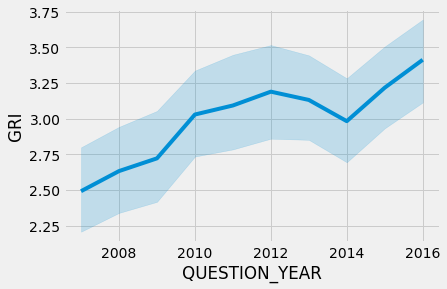

In [8]:
sns.lineplot(x='QUESTION_YEAR',y='GRI',data=Religion_data)


alt.Chart(Religion_data).mark_point().encode(
    x='QUESTION_YEAR:N',
    y='NATION_FK',
    color='REGION5',
    strokeDash='REGION5'
)